# TFMN4 Processing

## Overview

**Notebook setup and database sync**

**Designing and registering robotic run**
1. ~~Register all experimental variables and metadata in Google LIMS (experiment, dna constructs, strains, conditions)~~
2. ~~Name samples and put in LIMS Sample table.~~
3. ~~Assign plate and well locations to combinations based on Nidhi's layout.~~
4. ~~Load robotic_mt_plate table and verify proper location specifications (can't have same sample in two different wells, can't have two samples in one well, all wells must exist - no extra, no missing - and have at minimum 'condition' specified).~~
5. ~~Write plate_layout.csv as input to OD data extraction code. Manually added empty control wells. (These are necessary for assessing background contaminations.)~~

**Processing and uploading robotic OD data**
After conclusion of experiment, OD data was manually transferred from Box to poplar.



## Set-Up and LIMS-DB sync

In [ ]:
## Make sure running in aisynbio_env

In [23]:
# Reload magic command to ensure that changes made to my imported modules are being picked up by the notebook continuously

%load_ext autoreload
%autoreload 2

In [2]:
import sys
import os

# Add project root to path for access to workflows and tasks
notebook_dir = os.getcwd()
project_root = os.path.dirname(notebook_dir)

if project_root not in sys.path:
    sys.path.insert(0, project_root)

In [3]:
import os

# Must add environment's bin to the PATH inside the notebook
env_bin = os.path.join(os.path.dirname(sys.executable), "")
os.environ["PATH"] = env_bin + ":" + os.environ["PATH"]

In [170]:
# Import LIMS utilities (use util_simple.py for standalone LIMS API usage)

%run util_simple.py

✓ LIMS API loaded successfully


In [5]:
# Run a manual LIMS mirror db sync

from aisynbiopipeline.limsapi.sync import sync_all_sheets

sync_all_sheets()

2026-03-16 17:04:39,158 - lims_sync - INFO - Starting sync operation
2026-03-16 17:04:39,159 - lims_sync - INFO - Connecting to Google Sheets
2026-03-16 17:04:39,875 - lims_sync - INFO - Connecting to database
2026-03-16 17:04:40,110 - lims_sync - INFO - Found 17 worksheets: Experiments, Strains, Conditions, Samples, Measurements, Genes, Measurement_types, DNA_constructs, Primers, Wells, Seqorders, Seqsamples, robotic_mt_samples, dgoA_alleles_new, dgoA_alleles_old, Strain_stocks_ANL, Plasmid_stocks_ANL
2026-03-16 17:04:40,111 - lims_sync - INFO - Syncing worksheet: Experiments
2026-03-16 17:04:41,123 - lims_sync - INFO - Retrieved 12 rows from Experiments
2026-03-16 17:04:41,241 - lims_sync - INFO - Inserted 1, updated 0 rows in Experiments
2026-03-16 17:04:46,249 - lims_sync - INFO - Syncing worksheet: Strains
2026-03-16 17:04:47,283 - lims_sync - INFO - Retrieved 1020 rows from Strains
2026-03-16 17:04:47,470 - lims_sync - INFO - Inserted 6, updated 0 rows in Strains
2026-03-16 17:04

{'start_time': '2026-03-16T17:04:39.158364',
 'end_time': '2026-03-16T17:08:10.122902',
 'success': True,
 'tables_synced': 17,
 'total_rows_inserted': 277,
 'total_rows_updated': 0,
 'total_rows_deleted': 7,
 'errors': []}

## Designing and registering robotic run

Just some print statements to help manually fill the samples table in the LIMS Google Sheet. Eventually, this needs to be automated.

### Plate 1

In [24]:
experiment = ['TFMN4']
plate = ['exp1']
strains = ['ACN2586']
conditions = ['Pyruvate 20 mM']
DNA_constructs = [
    'fbaMUT',
    'fbaWT',
    'tpiAMUT',
    'tpiAWT',
    'fbaMUT-tpiAMUT',
    'fbaWT-tpiAWT',
    'combo10MUT',
    'combo10WT',
    'combo5MUT',
    'combo5WT',
    'comboTBD',
    'noDNA'
]
replicates = [str(x) for x in range(1,6)]

sample_names = []
replicate_samples = []

for d in DNA_constructs:
    replicate_sample = []
    for r in replicates:
        sample = experiment[0] + "." + plate[0] + "." + d  + "." + r
        replicate_sample.append(sample)
        sample_names.append(sample)
    reps = (", ").join(replicate_sample)
    replicate_samples.append(reps)

In [27]:
for i in sample_names:
    print(i)

TFMN4.exp1.fbaMUT.1
TFMN4.exp1.fbaMUT.2
TFMN4.exp1.fbaMUT.3
TFMN4.exp1.fbaMUT.4
TFMN4.exp1.fbaMUT.5
TFMN4.exp1.fbaWT.1
TFMN4.exp1.fbaWT.2
TFMN4.exp1.fbaWT.3
TFMN4.exp1.fbaWT.4
TFMN4.exp1.fbaWT.5
TFMN4.exp1.tpiAMUT.1
TFMN4.exp1.tpiAMUT.2
TFMN4.exp1.tpiAMUT.3
TFMN4.exp1.tpiAMUT.4
TFMN4.exp1.tpiAMUT.5
TFMN4.exp1.tpiAWT.1
TFMN4.exp1.tpiAWT.2
TFMN4.exp1.tpiAWT.3
TFMN4.exp1.tpiAWT.4
TFMN4.exp1.tpiAWT.5
TFMN4.exp1.fbaMUT-tpiAMUT.1
TFMN4.exp1.fbaMUT-tpiAMUT.2
TFMN4.exp1.fbaMUT-tpiAMUT.3
TFMN4.exp1.fbaMUT-tpiAMUT.4
TFMN4.exp1.fbaMUT-tpiAMUT.5
TFMN4.exp1.fbaWT-tpiAWT.1
TFMN4.exp1.fbaWT-tpiAWT.2
TFMN4.exp1.fbaWT-tpiAWT.3
TFMN4.exp1.fbaWT-tpiAWT.4
TFMN4.exp1.fbaWT-tpiAWT.5
TFMN4.exp1.combo10MUT.1
TFMN4.exp1.combo10MUT.2
TFMN4.exp1.combo10MUT.3
TFMN4.exp1.combo10MUT.4
TFMN4.exp1.combo10MUT.5
TFMN4.exp1.combo10WT.1
TFMN4.exp1.combo10WT.2
TFMN4.exp1.combo10WT.3
TFMN4.exp1.combo10WT.4
TFMN4.exp1.combo10WT.5
TFMN4.exp1.combo5MUT.1
TFMN4.exp1.combo5MUT.2
TFMN4.exp1.combo5MUT.3
TFMN4.exp1.combo5MUT.4
TFM

In [25]:
times5 = []
for i in replicate_samples:
    times5.append([i]*5)

for i in times5:
    for j in i:
        print(j)

TFMN4.exp1.fbaMUT.1, TFMN4.exp1.fbaMUT.2, TFMN4.exp1.fbaMUT.3, TFMN4.exp1.fbaMUT.4, TFMN4.exp1.fbaMUT.5
TFMN4.exp1.fbaMUT.1, TFMN4.exp1.fbaMUT.2, TFMN4.exp1.fbaMUT.3, TFMN4.exp1.fbaMUT.4, TFMN4.exp1.fbaMUT.5
TFMN4.exp1.fbaMUT.1, TFMN4.exp1.fbaMUT.2, TFMN4.exp1.fbaMUT.3, TFMN4.exp1.fbaMUT.4, TFMN4.exp1.fbaMUT.5
TFMN4.exp1.fbaMUT.1, TFMN4.exp1.fbaMUT.2, TFMN4.exp1.fbaMUT.3, TFMN4.exp1.fbaMUT.4, TFMN4.exp1.fbaMUT.5
TFMN4.exp1.fbaMUT.1, TFMN4.exp1.fbaMUT.2, TFMN4.exp1.fbaMUT.3, TFMN4.exp1.fbaMUT.4, TFMN4.exp1.fbaMUT.5
TFMN4.exp1.fbaWT.1, TFMN4.exp1.fbaWT.2, TFMN4.exp1.fbaWT.3, TFMN4.exp1.fbaWT.4, TFMN4.exp1.fbaWT.5
TFMN4.exp1.fbaWT.1, TFMN4.exp1.fbaWT.2, TFMN4.exp1.fbaWT.3, TFMN4.exp1.fbaWT.4, TFMN4.exp1.fbaWT.5
TFMN4.exp1.fbaWT.1, TFMN4.exp1.fbaWT.2, TFMN4.exp1.fbaWT.3, TFMN4.exp1.fbaWT.4, TFMN4.exp1.fbaWT.5
TFMN4.exp1.fbaWT.1, TFMN4.exp1.fbaWT.2, TFMN4.exp1.fbaWT.3, TFMN4.exp1.fbaWT.4, TFMN4.exp1.fbaWT.5
TFMN4.exp1.fbaWT.1, TFMN4.exp1.fbaWT.2, TFMN4.exp1.fbaWT.3, TFMN4.exp1.fbaWT.4, TFMN

### Plate 2: Test samples

In [30]:
# experiment = ['TFMN4']
# plate = ['exp2']
# strains = ['ACN3749', 'ACN3788', 'ACN3789']
# conditions = ['Methoxybenzoate 3 mM + Kan', 'Methoxybenzoate 3 mM']
# DNA_constructs = ['verBA_KmR_plasmid_x', 'int_library_x', 'int_library_y', 'int_library_z', 'gDNA_ACN3749_x']
# replicates = [str(x) for x in range(1,6)]

# sample_names = []
# replicate_samples = []

# for s in strains[1:]:
#     for d in DNA_constructs:
#         replicate_sample = []
#         for r in replicates:
#             sample = experiment[0] + "." + plate[0] + "." + s + "." + d  + "." + r
#             replicate_sample.append(sample)
#             sample_names.append(sample)
#         reps = (", ").join(replicate_sample)
#         replicate_samples.append(reps)

In [55]:
dna = input().split(' ')
dna

 noDNA concX_pBAC2264_BglI concX_pBAC2264_BglI_cleanup concX_pBAC2264_PCR_DpnI_cleanup concX_largeLib_EcorI concX_largeLib_SpeI concX_largeLib_SpeI_cleanup concX_largeLib_PCR_DpnI_cleanup concY_largeLib_PCR_DpnI_cleanup concX_smallLib_PCR_DpnI_cleanup concY_smallLib_PCR_DpnI_cleanup concX_gDNA3749 concY_gDNA3749


['noDNA',
 'concX_pBAC2264_BglI',
 'concX_pBAC2264_BglI_cleanup',
 'concX_pBAC2264_PCR_DpnI_cleanup',
 'concX_largeLib_EcorI',
 'concX_largeLib_SpeI',
 'concX_largeLib_SpeI_cleanup',
 'concX_largeLib_PCR_DpnI_cleanup',
 'concY_largeLib_PCR_DpnI_cleanup',
 'concX_smallLib_PCR_DpnI_cleanup',
 'concY_smallLib_PCR_DpnI_cleanup',
 'concX_gDNA3749',
 'concY_gDNA3749']

In [80]:
experiment = ['TFMN4']
plate = ['exp2']
strains = ['ACN3788']
conditions = ['Methoxybenzoate 4 mM + Kan']
DNA_constructs = dna
replicates = [str(x) for x in range(1,6)]

sample_names = []
replicate_samples = []

for s in strains:
    for d in DNA_constructs:
        replicate_sample = []
        for r in replicates:
            print(d)
            sample = experiment[0] + "." + plate[0] + "." + s + "." + d  + "." + r
            replicate_sample.append(sample)
            sample_names.append(sample)
        reps = (", ").join(replicate_sample)
        replicate_samples.append(reps)

noDNA
noDNA
noDNA
noDNA
noDNA
concX_pBAC2264_BglI
concX_pBAC2264_BglI
concX_pBAC2264_BglI
concX_pBAC2264_BglI
concX_pBAC2264_BglI
concX_pBAC2264_BglI_cleanup
concX_pBAC2264_BglI_cleanup
concX_pBAC2264_BglI_cleanup
concX_pBAC2264_BglI_cleanup
concX_pBAC2264_BglI_cleanup
concX_pBAC2264_PCR_DpnI_cleanup
concX_pBAC2264_PCR_DpnI_cleanup
concX_pBAC2264_PCR_DpnI_cleanup
concX_pBAC2264_PCR_DpnI_cleanup
concX_pBAC2264_PCR_DpnI_cleanup
concX_largeLib_EcorI
concX_largeLib_EcorI
concX_largeLib_EcorI
concX_largeLib_EcorI
concX_largeLib_EcorI
concX_largeLib_SpeI
concX_largeLib_SpeI
concX_largeLib_SpeI
concX_largeLib_SpeI
concX_largeLib_SpeI
concX_largeLib_SpeI_cleanup
concX_largeLib_SpeI_cleanup
concX_largeLib_SpeI_cleanup
concX_largeLib_SpeI_cleanup
concX_largeLib_SpeI_cleanup
concX_largeLib_PCR_DpnI_cleanup
concX_largeLib_PCR_DpnI_cleanup
concX_largeLib_PCR_DpnI_cleanup
concX_largeLib_PCR_DpnI_cleanup
concX_largeLib_PCR_DpnI_cleanup
concY_largeLib_PCR_DpnI_cleanup
concY_largeLib_PCR_DpnI_cleanup
c

In [77]:
len(sample_names)

65

In [79]:
# Not all of these actually exist!!
for i in sample_names:
    print(i)

TFMN4.exp2.ACN3788.noDNA.1
TFMN4.exp2.ACN3788.noDNA.2
TFMN4.exp2.ACN3788.noDNA.3
TFMN4.exp2.ACN3788.noDNA.4
TFMN4.exp2.ACN3788.noDNA.5
TFMN4.exp2.ACN3788.concX_pBAC2264_BglI.1
TFMN4.exp2.ACN3788.concX_pBAC2264_BglI.2
TFMN4.exp2.ACN3788.concX_pBAC2264_BglI.3
TFMN4.exp2.ACN3788.concX_pBAC2264_BglI.4
TFMN4.exp2.ACN3788.concX_pBAC2264_BglI.5
TFMN4.exp2.ACN3788.concX_pBAC2264_BglI_cleanup.1
TFMN4.exp2.ACN3788.concX_pBAC2264_BglI_cleanup.2
TFMN4.exp2.ACN3788.concX_pBAC2264_BglI_cleanup.3
TFMN4.exp2.ACN3788.concX_pBAC2264_BglI_cleanup.4
TFMN4.exp2.ACN3788.concX_pBAC2264_BglI_cleanup.5
TFMN4.exp2.ACN3788.concX_pBAC2264_PCR_DpnI_cleanup.1
TFMN4.exp2.ACN3788.concX_pBAC2264_PCR_DpnI_cleanup.2
TFMN4.exp2.ACN3788.concX_pBAC2264_PCR_DpnI_cleanup.3
TFMN4.exp2.ACN3788.concX_pBAC2264_PCR_DpnI_cleanup.4
TFMN4.exp2.ACN3788.concX_pBAC2264_PCR_DpnI_cleanup.5
TFMN4.exp2.ACN3788.concX_largeLib_EcorI.1
TFMN4.exp2.ACN3788.concX_largeLib_EcorI.2
TFMN4.exp2.ACN3788.concX_largeLib_EcorI.3
TFMN4.exp2.ACN3788.concX

In [68]:
# times5 = []
# for i in replicate_samples:
#     times5.append([i]*5)

# for i in times5:
#     for j in i:
#         print(j)

### Plate 2: Control samples

In [71]:
experiment = ['TFMN4']
plate = ['exp2']
strains = ['ACN3749', 'ACN3788']
conditions = ['Methoxybenzoate 4 mM + Kan', 'Methoxybenzoate 4 mM']
DNA_constructs = ['noDNA']
replicates = [str(x) for x in range(1,4)]

sample_names = []
replicate_samples = []

for s in strains:
    for d in DNA_constructs:
        replicate_sample = []
        for r in replicates:
            sample = experiment[0] + "." + plate[0] + "." + s + "." + d  + "." + r
            replicate_sample.append(sample)
            sample_names.append(sample)
        reps = (", ").join(replicate_sample)
        replicate_samples.append(reps)

In [72]:
# Not all of these actually exist!!

for i in sample_names:
    print(i)

TFMN4.exp2.ACN3749.noDNA.1
TFMN4.exp2.ACN3749.noDNA.2
TFMN4.exp2.ACN3749.noDNA.3
TFMN4.exp2.ACN3788.noDNA.1
TFMN4.exp2.ACN3788.noDNA.2
TFMN4.exp2.ACN3788.noDNA.3


### ~~Plate 2: Positive control samples~~

In [40]:
# experiment = ['TFMN4']
# plate = ['exp2']
# strains = ['ACN3749', 'ACN3788', 'ACN3789']
# conditions = ['Methoxybenzoate 3 mM + Kan', 'Methoxybenzoate 3 mM']
# DNA_constructs = ['noDNA']
# replicates = [str(x) for x in range(1,5)]

# sample_names = []
# replicate_samples = []

# for s in [strains[0]]:
#     for d in DNA_constructs:
#         replicate_sample = []
#         for r in replicates:
#             sample = experiment[0] + "." + plate[0] + "." + s + "." + d  + "." + r
#             replicate_sample.append(sample)
#             sample_names.append(sample)
#         reps = (", ").join(replicate_sample)
#         replicate_samples.append(reps)

In [73]:
# for i in sample_names:
#     print(i)

In [74]:
# times5 = []
# for i in replicate_samples:
#     times5.append([i]*4)

# for i in times5:
#     for j in i:
#         print(j)

In [81]:
# Run a manual LIMS mirror db sync

from aisynbiopipeline.limsapi.sync import sync_all_sheets

sync_all_sheets()

2026-04-08 03:16:55,580 - lims_sync - INFO - Starting sync operation
2026-04-08 03:16:55,615 - lims_sync - INFO - Connecting to Google Sheets
2026-04-08 03:16:56,379 - lims_sync - INFO - Connecting to database
2026-04-08 03:16:56,630 - lims_sync - INFO - Found 17 worksheets: Experiments, Strains, Conditions, Samples, Measurements, Genes, Measurement_types, DNA_constructs, Primers, Wells, Seqorders, Seqsamples, robotic_mt_samples, dgoA_alleles_new, dgoA_alleles_old, Strain_stocks_ANL, Plasmid_stocks_ANL
2026-04-08 03:16:56,631 - lims_sync - INFO - Syncing worksheet: Experiments
2026-04-08 03:16:57,993 - lims_sync - INFO - Retrieved 12 rows from Experiments
2026-04-08 03:16:58,100 - lims_sync - INFO - Inserted 1, updated 0 rows in Experiments
2026-04-08 03:16:58,115 - lims_sync - INFO - Marked 1 rows as deleted in Experiments
2026-04-08 03:17:03,116 - lims_sync - INFO - Syncing worksheet: Strains
2026-04-08 03:17:04,381 - lims_sync - INFO - Retrieved 1020 rows from Strains
2026-04-08 03:

{'start_time': '2026-04-08T03:16:55.580252',
 'end_time': '2026-04-08T03:21:01.250491',
 'success': True,
 'tables_synced': 17,
 'total_rows_inserted': 134,
 'total_rows_updated': 0,
 'total_rows_deleted': 121,
 'errors': []}

In [82]:
# There should be 120 samples, each with a unique name.
# There should be 120 unique well locations (60 wells in 2 plates).
# There should be 120 unique sample-well combinations.

mt_samples = query_lims('robotic_mt_samples', filters={'Experiment': 'TFMN4'})
print(len(mt_samples))
print(len(mt_samples.groupby(['Name', 'Plate_name', 'Microtiter_plate_well'])))
print(len(mt_samples.groupby(['Plate_name', 'Microtiter_plate_well'])))
print(mt_samples['Name'].nunique())

120
120
120
120


In [203]:
# There should be 120 samples, each with a unique name.
# There should be 120 unique well locations (60 wells in 2 plates).
# There should be 120 unique sample-well combinations.

mt_samples = query_lims('robotic_mt_samples', filters={'Experiment': 'TFMN4'})
print(len(mt_samples))
print(len(mt_samples.groupby(['Name', 'Plate_name', 'Microtiter_plate_well'])))
print(len(mt_samples.groupby(['Plate_name', 'Microtiter_plate_well'])))
print(mt_samples['Name'].nunique())

120
120
120
120


### Write mt_samples to plate_layout

In [212]:
blank_media = "media"
blank_experiment = "TFMN4"
blank_type = "mt_plate"

from aisynbiopipeline.workflows.roboticALE import PLATE_WELLS, REQUIRED_PLATE_LAYOUT_COLUMNS

In [204]:
mt_samples.insert(len(mt_samples.columns), 'Blank', False)

In [213]:
# -------------------------------------------------------------------
# 1. Check for duplicate wells within each plate
# -------------------------------------------------------------------

dupes = mt_samples[mt_samples.duplicated(subset=["Plate_name", "Microtiter_plate_well"], keep=False)]

if not dupes.empty:
    raise ValueError(
        "Duplicate well locations detected:\n"
        + str(dupes.sort_values(["Plate_name", "Microtiter_plate_well"]))
    )

# -------------------------------------------------------------------
# 2. Create complete plate/well index
# -------------------------------------------------------------------

all_plate_wells = pd.MultiIndex.from_product(
    [mt_samples["Plate_name"].unique(), PLATE_WELLS],
    names=["Plate_name", "Microtiter_plate_well"]
).to_frame(index=False)

# -------------------------------------------------------------------
# 3. Merge with existing dataframe
# -------------------------------------------------------------------

mt_samples_full = all_plate_wells.merge(
    mt_samples,
    on=["Plate_name", "Microtiter_plate_well"],
    how="left"
)

# -------------------------------------------------------------------
# 4. Fill missing wells as blanks
# -------------------------------------------------------------------

missing_mask = mt_samples_full["Name"].isna()

mt_samples_full.loc[missing_mask, "Blank"] = True
mt_samples_full.loc[missing_mask, "Condition"] = blank_media
mt_samples_full.loc[missing_mask, "Experiment"] = blank_experiment
mt_samples_full.loc[missing_mask, "Type"] = blank_type

# -------------------------------------------------------------------
# 5. Optional sorting
# -------------------------------------------------------------------

mt_samples_full = mt_samples_full.sort_values(["Plate_name", "Microtiter_plate_well"]).reset_index(drop=True)

In [215]:
plate_layout_fn = "/storage/synbio/ai_synbio_data/experimental_data/robotic_od_data/TFMN4_04-09-26/plate_layout.csv"
mt_samples_full[REQUIRED_PLATE_LAYOUT_COLUMNS].to_csv(plate_layout_fn)

In [216]:
from aisynbiopipeline.workflows.roboticALE import load_and_verify_plate_layout

layout = load_and_verify_plate_layout(
    plate_layout_fn
)

## Processing and uploading robotic OD data

In [218]:
from aisynbiopipeline.workflows.roboticALE import load_and_verify_robotic_od_data

dst = "/storage/synbio/ai_synbio_data/experimental_data/robotic_od_data/TFMN4_04-09-26"
fname_pattern = r'(?P<experiment>\w+)_(?P<timestamp>\d+)_(?P<uniqueID>\w+)_(?P<series>\w+)_(?P<transfer>\d+)_(?P<timepoint>\w+).txt'

files = load_and_verify_robotic_od_data(
    dst, 
    fname_pattern,
)

In [219]:
from aisynbiopipeline.workflows.roboticALE import extract_robotic_od_data_to_df

data = extract_robotic_od_data_to_df(files, fname_pattern)

In [220]:
from aisynbiopipeline.workflows.roboticALE import map_plate_layout_to_data

data = map_plate_layout_to_data(data, layout)

In [221]:
from aisynbiopipeline.workflows.roboticALE import compute_background#, compute_inoculation

data = compute_background(data)

# data = compute_inoculation(data) # Currently not working!

In [222]:
from aisynbiopipeline.workflows.roboticALE import correct_timestamps

data = correct_timestamps(data, dst + '/' + 'AccurateTimestamps')

In [223]:
from aisynbiopipeline.workflows.roboticALE import verify_and_write_processed_data

verify_and_write_processed_data(data, output_path=os.path.join(dst, "TFMN4_robotic_OD_processed_final.csv"))

In [236]:
from aisynbiopipeline.limsapi.googledrive import upload_or_replace

folder_id = "17uCtYmp8absnYW_mEk6XTtar6nsp63pQ"
upload_or_replace(os.path.join(dst, "TFMN4_robotic_OD_processed_final.csv"), folder_id)

In [224]:
plot_dir = dst + "/" + "png_plots"
os.makedirs(plot_dir, exist_ok=True)

exp1


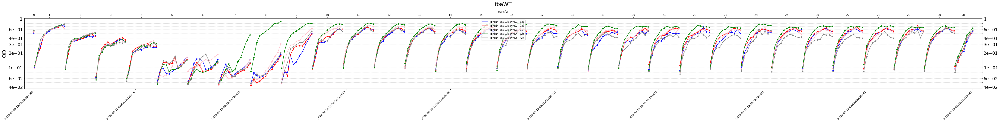

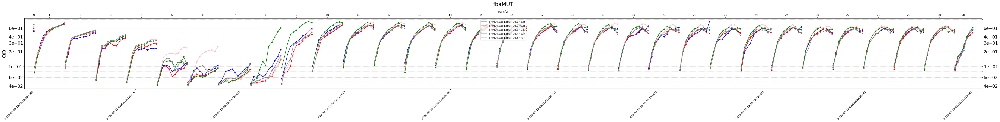

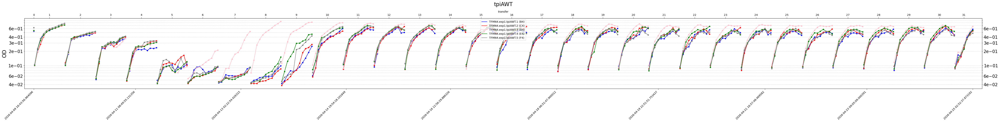

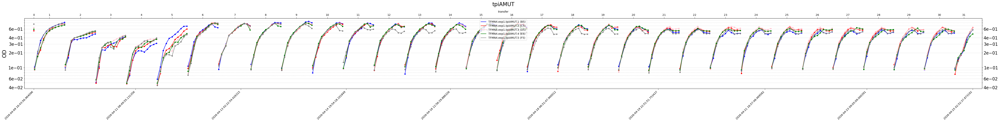

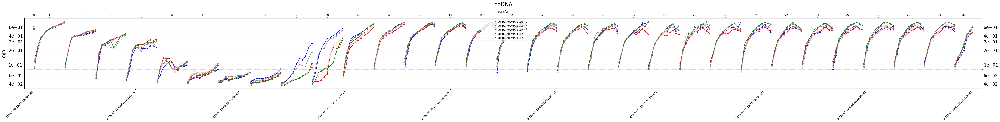

...

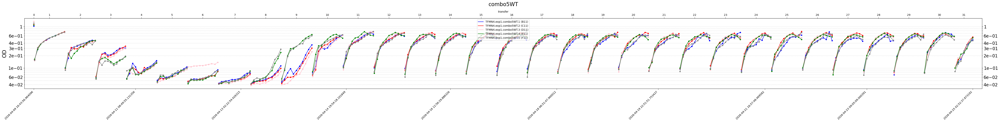

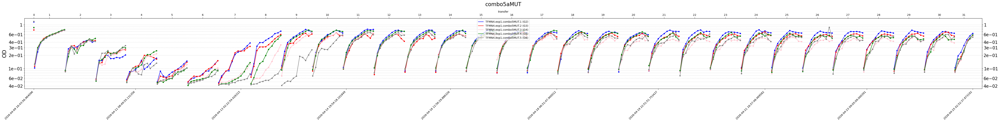

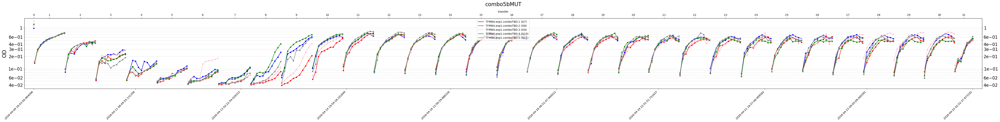

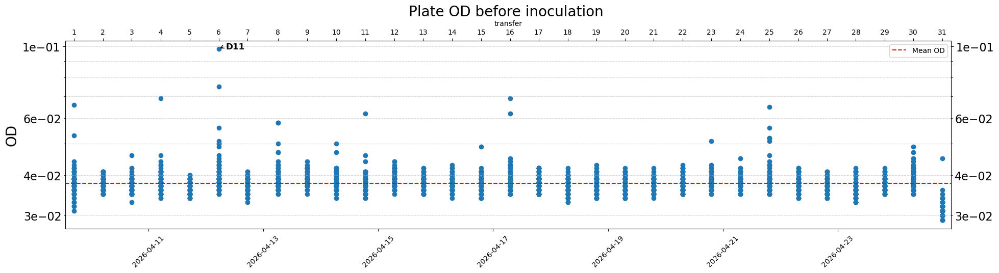

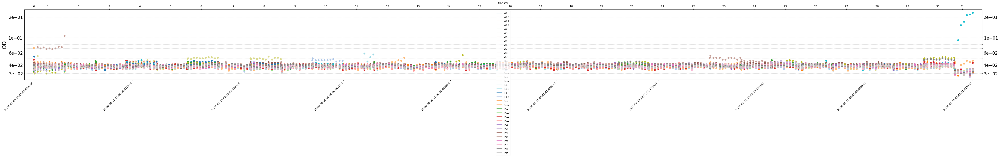

exp2


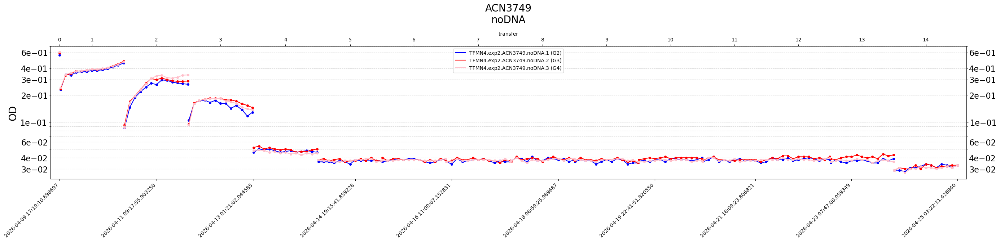

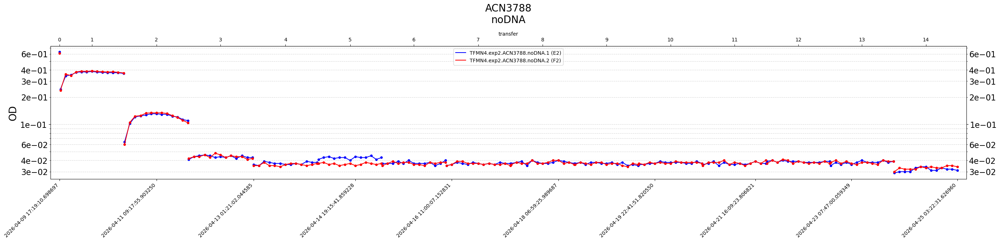

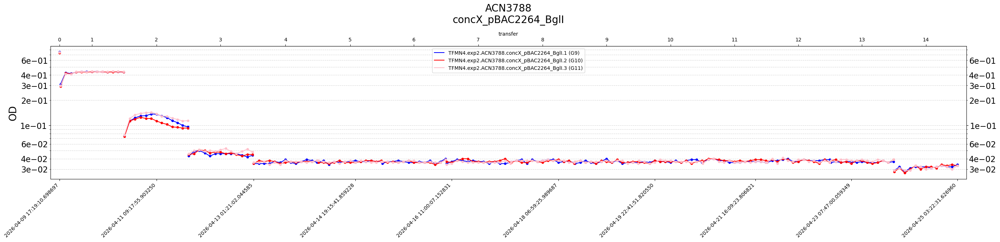

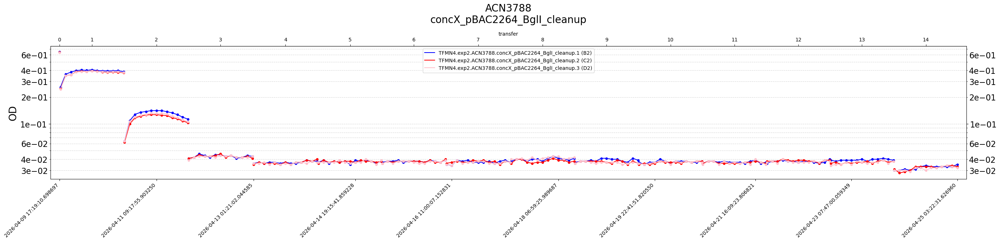

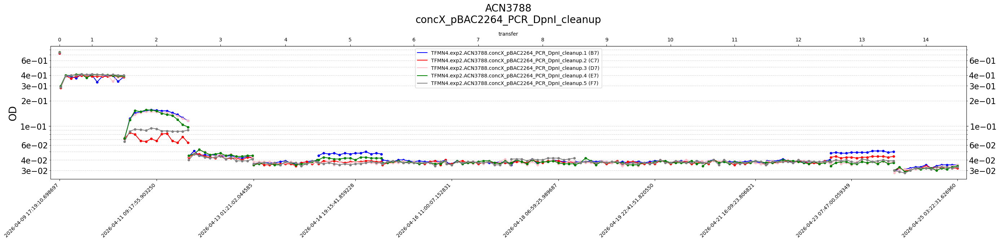

...

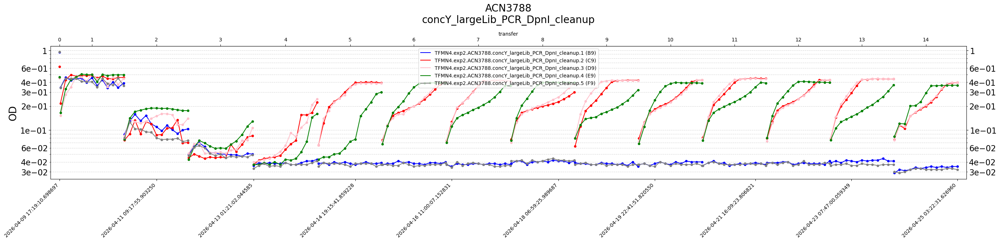

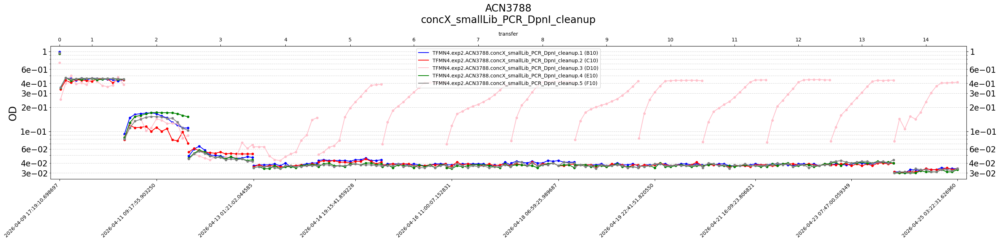

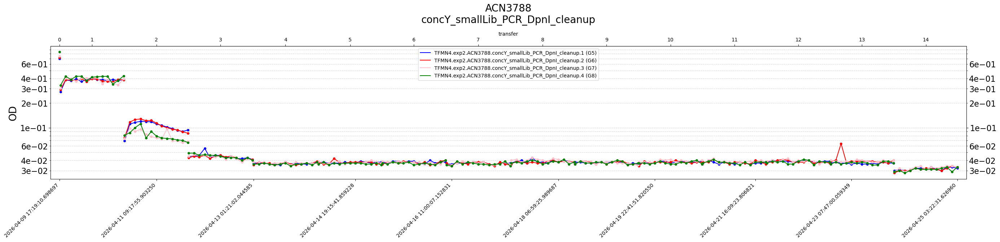

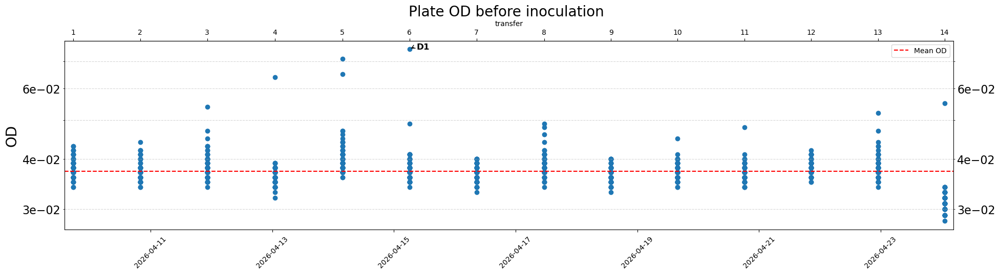

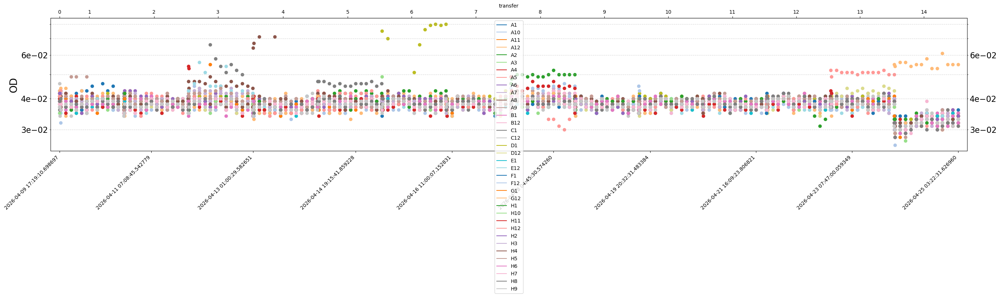

In [238]:
from aisynbiopipeline.workflows.growth_curve_plotting import plot_OD_replicates, plot_OD_contam
from aisynbiopipeline.limsapi.googledrive import upload_or_replace
from matplotlib.backends.backend_pdf import PdfPages

for plate_name, group in data.groupby('Plate_name'):

    print(plate_name)
    
    # Define data groupings to be plotted
    test = group.loc[(group['Blank'] == False) & (group['reading'] != 'contam')]
    contam = group.loc[(group['reading'] == 'contam')]
    blank = group.loc[(group['Blank'] == True)]

    # Set-up for pdf upload to Google Drive
    folder_id = "17uCtYmp8absnYW_mEk6XTtar6nsp63pQ"
    pdf_path = os.path.join(dst, f'TFMN4_{plate_name}_roboticOD_final.pdf')

    with PdfPages(pdf_path) as pdf:
        
        # Test samples: group by plotting groups
        for name, group in test.groupby(['Plotting_group_number', 'Plotting_group_name']):
            
            plot_title = name[1].replace(r"\n", "_")
            file_name = plate_name + "_" + plot_title.replace(" ", "_") + ".png"
            plot_OD_replicates(group, subtract_background=False, blank=False,
                               yscale='log', append_title=name[1].replace(r"\n", "\n"),
                               pdf=pdf, png=True, png_path=plot_dir + "/" + file_name)
    
        # Control samples - Before inoculation
        file_name = plate_name + "_contam.png"
        plot_OD_contam(contam, subtract_background=False,
                       yscale='log', append_title='Plate OD before inoculation',
                       pdf=pdf, png=True, png_path=plot_dir + "/" + file_name)

        # Control samples - Before inoculation
        file_name = plate_name + "_blank.png"
        plot_OD_replicates(blank, subtract_background=False, blank=True,
                           yscale='log', append_title="",
                           pdf=pdf, png=True, png_path=plot_dir + "/" + file_name)

    upload_or_replace(pdf_path, folder_id)

In [237]:
# Uploading png_plots to GDrive

from aisynbiopipeline.limsapi.googledrive import upload_folder

folder_id = "17uCtYmp8absnYW_mEk6XTtar6nsp63pQ"
upload_folder(plot_dir, folder_id)

'1k1L14VXrHGlovWQmjynPygQ6imvwwVk0'

# Make measurements table to insert into LIMS sheet

Name	Type	Experiment	Sample ID	Protocol	Who measured	Lab	Timestamp	Data

In [240]:
m_type = "OD_series_robot"
experiment = "TFMN4"
staff = "BMG microplate reader"
lab = "ANL - SDL in 446"
timestamp = "04/09/2026"
data = "https://drive.google.com/drive/folders/17uCtYmp8absnYW_mEk6XTtar6nsp63pQ"

In [241]:
mt_samples = query_lims('robotic_mt_samples', filters={'Experiment': 'TFMN4'})

m_table = mt_samples[['Name']].copy()
m_table.rename(columns={'Name': 'Sample ID'}, inplace=True)
m_table['Name'] =  m_table['Sample ID'] + m_type
m_table['Type'] = m_type
m_table['Experiment'] = experiment
m_table['Protocol'] = pd.NA
m_table['Who measured'] = staff
m_table['Lab'] = lab
m_table['Timestamp'] = timestamp
m_table['Data'] = data

m_table = m_table[['Name', 'Type', 'Experiment', 'Sample ID', 'Protocol', 'Who measured', 'Lab', 'Timestamp', 'Data']]

In [245]:
m_table.to_csv('/storage/nspahr/tmp/measurement_table.csv')